# Software Coaching for Python
# Week 6: Project Presentation

In [ ]:
from google.colab import drive

drive.mount('/content/drive')
path = "/content/drive/Shared drives/PythonCoaching_2023Summer"
my_folder = "ljw33083418"     # *** REPLACE WITH YOUR FOLDER NAME ***
outcome_folder = f"{path}/{my_folder}/outcome"
classdata_folder = f"{path}/classdata"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Executive Summary

### Name

이재원

### Target Web Site

ReadWrite.com: https://readwrite.com/
(*** 클릭!)

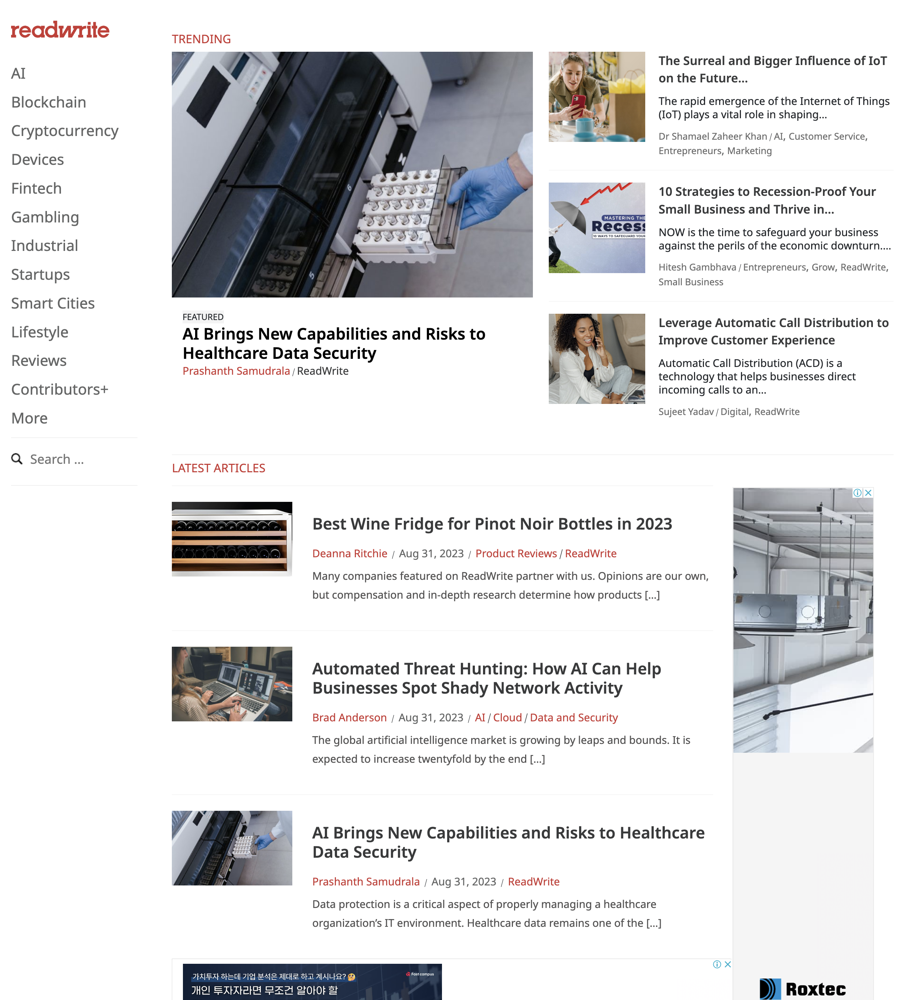

In [ ]:
from IPython.display import Image
Image(f"{path}/{my_folder}/readwrite_first.png")

### Reasons Why I Chose the Web Site

- ReadWrite.com은 2003년에 시작된, IT News를 다루는 웹사이트.
  - 기술, 비즈니스 및 혁신 관련 주제를 다루는 웹사이트로, 기술 뉴스, 기사, 리뷰 등을 제공.

<br>

- ReadWrite 주제별 분류
  - AI
  - Blockchain
  - Cyptocurrency
  - Devices
  - Fintech
  - Gambling
  - Industrial
  - Startups
  - Smart Cities
  - Lifestyle
  - Reviews
  - Sales
  - Marketing
  - Customer
  - Service
  - IoT
  - AR/VR
  - Code
  - Data and Security
  - Energy
  - Hack
  - Web
  - Productivity
  - Culture
  - Branding
  - Tech
  - Cloud
  - Connect
  - Deals
  - Fund
  - Health

<br>

- 이에 2003년부터 지금까지의 모든 기사들을 수집해, IT 기술과 관련하여 어떠한 Insight들을 얻을 수 있는 지 분석해보고자 함. 또한 __각 카테고리 별__ 어떤 기술이 당시에 영향력이 있었는 지를 확인해보고자 함.

### Total Number of Web Articles Collected

27,211 건

### Data Time Range

2003-4-19 - 2023-8-19 (약 20년)

### Key Findings and Lessons

- 전반적으로 카테고리 별 해당 기술에 대한 키워드들이 적절하게 추출됨을 확인할 수 있었음

- AI: 2023년 7월 16일에 게시물 게재수 최대치를 찍었고, 해당 주간의 기사들을 살펴봤을 때 OpenAI의 ChatGPT가 화재였음을 확인할 수 있었음

- Web: 2012년 1월 18일에 미국에서 SOPA와 PIPA와 같은 인터넷 저작권 관련 법안에 대해 대규모 인터넷 시위가 발생했었는데, 해당 기간에 게시물 게재 수가 최대치를 찍었던 것을 확인할 수 있었음

- Smart Cities: 2016년에 게시물 게재수가 많았는데, nvidia가 GPU를 활용해 비디오 인식, 자율 주행 자동차 등 스마트시티 혁신을 촉진하기 위해 다양한 기술과 솔루션을 개발하고 있었음을 확인할 수 있었음

### Major Challenges

- 키워드 분석에 있어 stopword로 사전 정의하기 애매한 단어들이 다수 등장하여 유의미한 키워드들을 밝혀내는 작업을 어렵게 만들었음

- 전체 글들을 clustering 하는 과정에서, Web 카테고리에 대한 내용이 압도적으로 많은 양을 차지하였기 때문에, 이를 고르게 clustering하기가 쉽지 않았음

### Future Work

- 키워드를 분석하는 과정에서 주로 기사의 '본문'에서 키워드를 추출했는데, 기사의 '제목'을 기준으로 키워드를 추출한다면 조금 더 그 당시에 발생한 사건에 대해 눈에 띄는 결과를 확인할 수 있지 않을까 싶음

- N-grams를 이용해서 키워드 추출을 한다면, 기사에서의 연속된 단어 조합을 분석하여 더 의미있는 키워드를 도출할 수 있을 것으로 예상됨

## Installing Necessary Packages

In [ ]:
! pip install --user --upgrade nltk pandas pyLDAvis==3.4.1 scikit-learn textblob

## Loading Data

In [ ]:
import pandas as pd
pd.set_option('display.max_colwidth', 150)

df = pd.read_csv(f"{outcome_folder}/project/html_data.csv", sep="\t", lineterminator='\n')
df = df.dropna(subset=["title", "body"], axis=0)
df.timestamp = pd.to_datetime(df.timestamp, format="%b %d, %Y")

df

,category,title,author,timestamp,body
0,"{'AI', 'Tech', 'Blockchain'}",10 Fabulous Predictions for the Future of Cryptocurrencies,Karthik Shanmugam,2019-08-05,Cryptocurrencies have come a long way since the first Bitcoin which used to buy a couple of pizzas. Few of the people who owned these currencies s...
1,"{'AI', 'Marketing', 'Connected Devices', 'IoT'}",10 Ways Smart Businesses Are Leveraging IoT And AI To Bolster Business Conversion In 2019,Joseph Chukwube,2019-04-17,"As a business owner, you must understand that creating awareness for your brand, product or services online and converting this awareness into act..."
2,"{'AI', 'Web', 'IoT'}",10 Ways Translation Tools Help Post-Pandemic,Reuven Koret,2020-08-18,"Translation tools are the kind of things we tend to take for granted – until we need them. My family used translation tools a lot while traveling,..."
3,{'AI'},11 Artificial Intelligence Trends Every Business Must Know in 2019,Sohaib Khalid,2019-04-01,"Artificial Intelligence (AI) has been a game changer for global businesses, opening doors to innumerable possibilities. With the integration of AI..."
4,"{'AI', 'Industrial', 'Security', 'Tech'}",11 NLP Use Cases: Putting the Language Comprehension Tech to Work,Pramod Kumar,2023-05-29,"Natural Language Processing (NLP), which encompasses areas such as linguistics, computer science, and artificial intelligence, has been developed ..."
...,...,...,...,...,...
27207,{'Web'},Zune – Social Networking Differentiates It From iPod,Richard macmanus,2006-09-14,"Microsoft has released details of its upcoming Zune product, an iPod-like device that is squarely aimed at challenging Apple’s dominance of the on..."
27208,{'Web'},Zuora Announces Z-Commerce for the Cloud,Audrey watters,2010-06-23,"Zuora, a subscription billing company, announces today the release of Z-Commerce for the Cloud. Z-Commerce enables cloud providers to automate me..."
27209,{'Web'},ZURB Design Wants To Help Your Nonprofit Complete A Mission,Jon mitchell,2011-08-04,"Silicon Valley design agency ZURB is holding their fourth annual ZURBwired event on August 18, in which the firm donates 24 hours of their time to..."
27210,{'Web'},Zync: Making Local Search Personal,Josh catone 1,2007-09-21,"Zync, a Massachusetts-based startup, operates a local event recommendation engine based around the city of Boston. The site currently lists 30,00..."


- 'category': 해당 article이 어느 카테고리에 속해있는 지를 나타냄. 하나의 article이 여러 category에 포함되는 경우가 있기 때문에, 이를 set 형식으로 모두 찾아서 넣어줌.

- 'title': article의 제목

- 'author': article을 쓴 저자

- 'timestamp': 발행일

- 'body': 본문 내용

https://fivethirtyeight.com/features/the-red-sox-seemed-unstoppable-then-the-astros-turned-the-tables/

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27212 entries, 0 to 27211
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   category   27212 non-null  object        
 1   title      27212 non-null  object        
 2   author     27212 non-null  object        
 3   timestamp  27212 non-null  datetime64[ns]
 4   body       27212 non-null  object        
dtypes: datetime64[ns](1), object(4)
memory usage: 1.0+ MB


- 모든 article들을 크롤링하는 과정에서, 하나의 칼럼이라도 Null이 존재한다면 csv파일에 저장하지 않았기 때문에, dropna()이후에도 27211개의 row가 유지됨

## Popular Keywords Ranking

In [ ]:
import nltk
nltk.download(['punkt', 'averaged_perceptron_tagger', 'stopwords'])

%time df["words"] = df.body.apply(lambda x: nltk.word_tokenize(x)) # word tokenizing
%time df["tagged_words"] = df.words.apply(lambda x: nltk.pos_tag(x)) # 품사 tagging

In [ ]:
df

In [ ]:
import ast

df['category'] = df['category'].apply(lambda x: ast.literal_eval(x))

In [ ]:
df_all = []

df_ai = df[df['category'].apply(lambda x: 'AI' in x)]; df_all.append(('AI', df_ai)) #1254 rows
df_web = df[df['category'].apply(lambda x: 'Web' in x)]; df_all.append(('Web', df_web)) #17024 rows
df_smart_cities = df[df['category'].apply(lambda x: 'Smart Cities' in x)]; df_all.append(('Smart Cities', df_smart_cities)) #2171 rows
df_iot = df[df['category'].apply(lambda x: 'IoT' in x)]; df_all.append(('IoT', df_iot)) #781 rows
df_hack = df[df['category'].apply(lambda x: 'Hack' in x)]; df_all.append(('Hack', df_hack)) #1452 rows
df_tech = df[df['category'].apply(lambda x: 'Tech' in x)]; df_all.append(('Tech', df_tech)) #2012 rows
df_devices = df[df['category'].apply(lambda x: 'Devices' in x)]; df_all.append(('Devices', df_devices)) #1096 rows

- 대표 카테고리 별 article 수
    - AI: 1,254 rows
    - Web: 17,024 rows
    - Smart Cities: 2,171 rows
    - IoT: 781 rows
    - Hack: 1,452 rows
    - Tech: 2,012 rows
    - Devices: 1,096 rows

<br>

- 카테고리 별 게시글의 수가 고르지 못함 + __category별로 분석을 해줘야 유의미한 insight를 추출할 수 있다고 판단하여 대표 7개의 category를 정함__ (row 개수를 기준으로 선정)
  - 대표 7개의 category: AI, Web, Smart Cities, IoT, Hack, Tech, Devices


In [ ]:
from collections import Counter

def get_counter(dataframe, stopwords=[], target_tag=None):
    counter = Counter()

    for l in dataframe.tagged_words:
        word_set = set()

        for t in l:
            word = t[0].lower()
            tag = t[1]

            ##########################################################
            # Check if the word is a stopword.
            ##########################################################
            if word in stopwords:
                continue

            if target_tag is None:
                word_set.add(word)
            else:
                ##########################################################
                # Check the tag
                ##########################################################
                if tag.startswith(target_tag):
                    word_set.add(word)
                else:
                    continue

        counter.update(word_set)     # Be aware of the indentation!

    return counter

In [ ]:
from nltk.corpus import stopwords
global_stopwords = nltk.corpus.stopwords.words("english")

import string
local_stopwords = [c for c in string.punctuation] + ['‘', '’', '”', '“',  '—', '…', "could", "may", "might", "would", "also", "among", "r", "–"]

### Overall Popular Keywords

In [ ]:
counter_all = []
for df_t in df_all:
  print('category: ', df_t[0])
  counter_all.append((df_t[0], get_counter(df_t[1], global_stopwords+local_stopwords)))
  print(counter_all[-1][1].most_common(50)); print()

category:  AI
[('ai', 1056), ('data', 1030), ('technology', 1028), ('use', 992), ('one', 992), ('new', 966), ('like', 962), ('make', 944), ('time', 943), ('intelligence', 930), ('many', 896), ('help', 894), ('need', 877), ('even', 871), ('artificial', 863), ('using', 861), ('companies', 825), ('better', 817), ('way', 800), ('learning', 782), ('business', 780), ('information', 779), ('future', 765), ('work', 758), ('used', 752), ('human', 735), ('people', 716), ('potential', 715), ('world', 711), ('take', 708), ('machine', 704), ('however', 689), ('first', 679), ('become', 671), ('process', 659), ('years', 654), ('businesses', 650), ('provide', 643), ('making', 643), ('industry', 642), ('systems', 633), ('company', 630), ('example', 625), ('tools', 616), ('get', 615), ('technologies', 614), ('well', 610), ('improve', 609), ('every', 602), ('already', 590)]

category:  Web
[('new', 11126), ('one', 10851), ('like', 10771), ('web', 8340), ('time', 7943), ('users', 7795), ('people', 7715), 

- 7개의 카테고리에 대해 전체 워드를 대상으로 빈도수 상위 50개의 키워드를 추출한 결과,
  - 공통적으로 포함된 키워드: 'new' -> IT 뉴스를 다루는 웹사이트이다 보니 'new'가 상위 키워드로 추출됨
  - 카테고리 별로 해당 카테고리의 키워드 또한 상위 키워드로 추출됨

- 그 외로는, 전체 워드를 대상으로 분석한 결과에선 크게 유의미한 결과는 추출되지 않음

AI


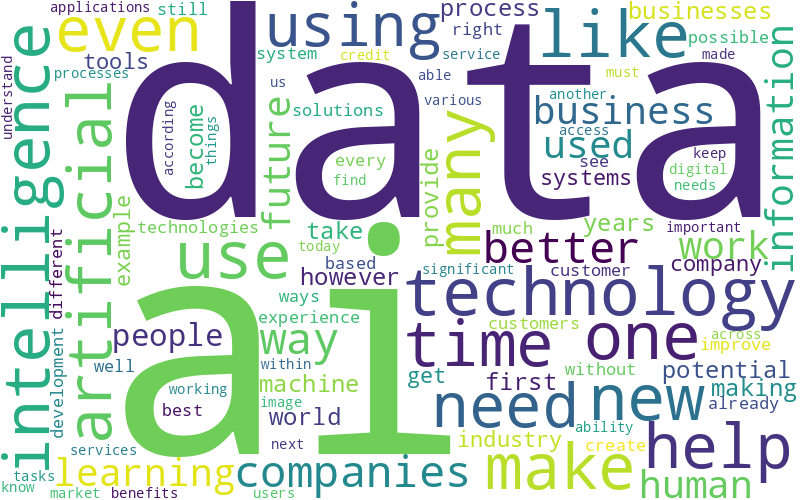


Web


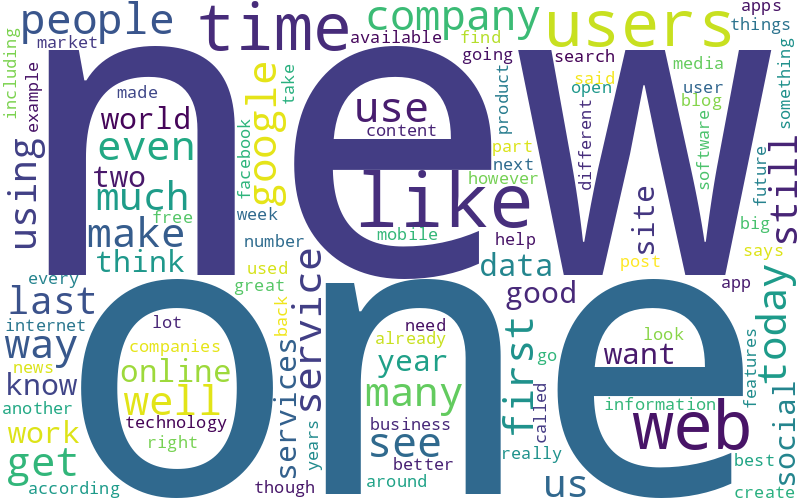


Smart Cities


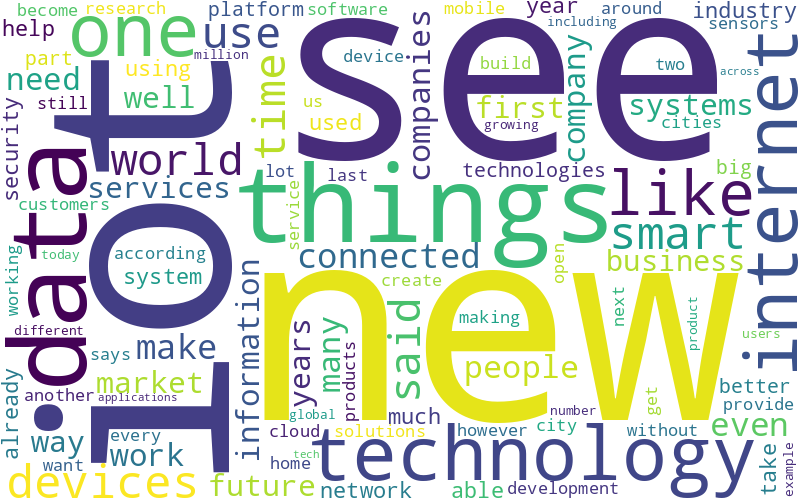


IoT


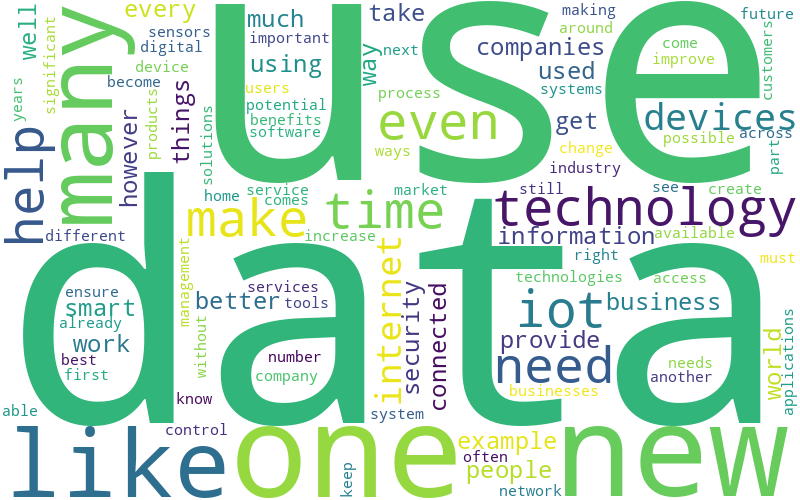


Hack


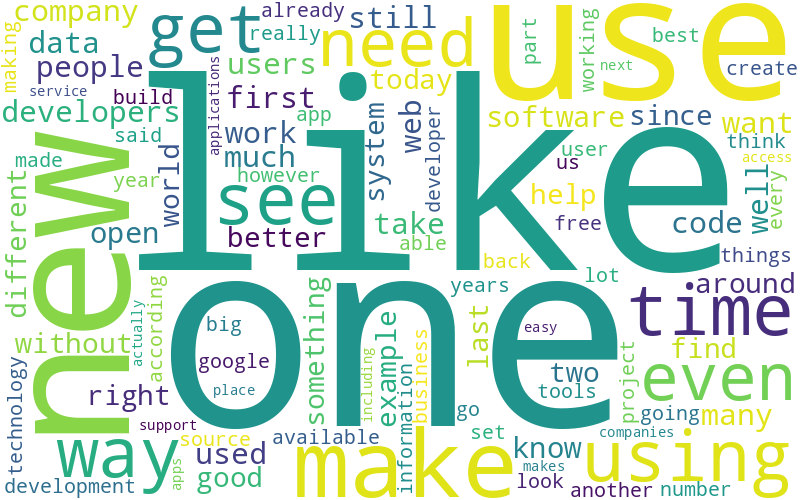


Tech


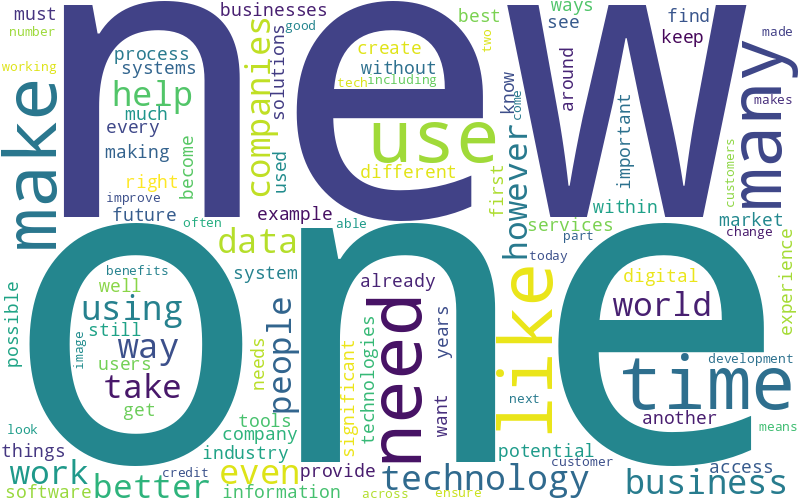


Devices


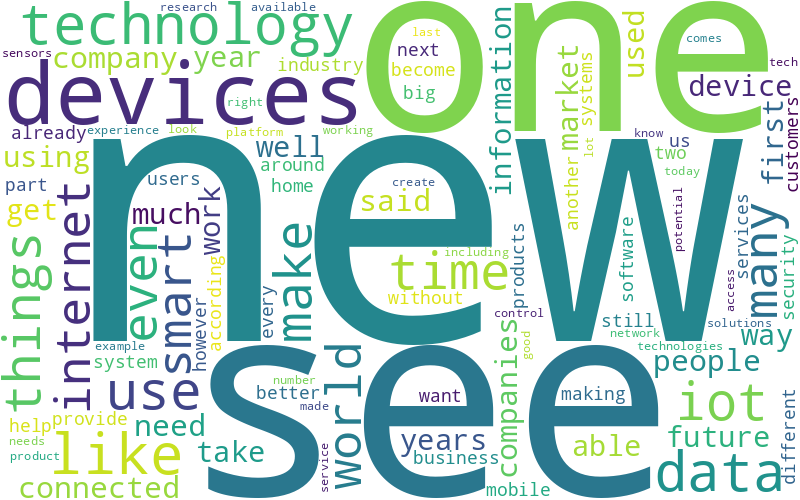

In [ ]:
from IPython.display import Image
from wordcloud import WordCloud

def draw_wordcloud(counter, image_file_name, max_words=100):
    wc = WordCloud(background_color="white", max_words=max_words, width=800, height=500)
    wc.generate_from_frequencies(counter)
    wc.to_file(image_file_name)
    display(Image(filename=image_file_name))

for ca in counter_all:
  print(ca[0])
  draw_wordcloud(ca[1], f"{outcome_folder}/wordcloud_all_{ca[0]}.png", 100); print()

### Popular Nouns Representing Hot Topics

In [ ]:
counter_nouns = []
for df_t in df_all:
  print('category: ', df_t[0])
  counter_nouns.append((df_t[0], get_counter(df_t[1], global_stopwords+local_stopwords, "NN")))
  print(counter_nouns[-1][1].most_common(50)); print()

category:  AI
[('ai', 1054), ('technology', 1028), ('data', 1028), ('time', 943), ('intelligence', 930), ('companies', 825), ('way', 800), ('business', 780), ('information', 779), ('use', 715), ('people', 714), ('world', 711), ('machine', 704), ('learning', 691), ('future', 671), ('years', 654), ('businesses', 650), ('industry', 642), ('systems', 633), ('company', 630), ('example', 625), ('tools', 616), ('technologies', 614), ('process', 614), ('solutions', 590), ('customer', 586), ('work', 575), ('development', 571), ('customers', 553), ('ways', 544), ('experience', 534), ('system', 533), ('market', 529), ('applications', 528), ('services', 524), ('today', 511), ('users', 496), ('things', 493), ('benefits', 489), ('service', 479), ('image', 479), ('tasks', 479), ('credit', 469), ('ability', 468), ('access', 461), ('management', 455), ('software', 449), ('research', 443), ('need', 433), ('results', 431)]

category:  Web
[('time', 7942), ('web', 7933), ('users', 7779), ('people', 7709),

- 명사들만을 대상으로 한 키워드 분석
  - AI: 'ai', 'technology', 'data', 'intelligence', 'information', 'machine', 'learning', 'future'등과 같이 인공지능과 관련된 키워드들이 추출됨
  - Web: 'time', 'web', 'users', 'today', 'google', 'service', 'site', 'internet', 'post', 'blog', 'online', 'network', 'twitter' 등과 같이 구글, 트위터, 블로그처럼 웹과 관련된 키워드들이 추출됨
  - Smart Cities: 'iot', 'things', 'devices', 'internet', 'people', 'home' 등과 같이 사물인터넷과 스마트 시티에 관련된 키워드들이 추출됨
  - Hack: 'way', 'developers', 'web', 'users', 'code' 등과 같이 해킹과 관련된 키워드들이 추출됨

- 예상했던 바와 같이 카테고리별 그와 관련된 키워드들이 어느 정도 자주 등장함

In [ ]:
mask = df_hack.body.str.contains("time", case=False)
df_hack[mask][["timestamp", "title", "body"]]

,timestamp,title,body
245,2023-06-28,Exploring the Influence of AI on Fraud Prevention in Telecoms,"Over the past few decades, the telecommunications industry has experienced an immense revolution, with mobile phones and internet services becomin..."
257,2023-06-22,Fortifying National Security: Inside the DoJ’s New Cybersecurity Unit Combatting State-Backed Hackers,"In the ever-evolving landscape of technology, cybersecurity has become a paramount concern for governments and organizations worldwide. With the r..."
302,2019-07-18,How AI Helps Secure Your Finances and Other Stuff on Mobile,Modern smart gadgets and mobiles are made for your convenience. They are loaded with features even when you have not installed the applications. T...
807,2020-02-05,Building a Blockchain Police Bodycam PoC for $25,Video forgery is becoming an epidemic. Blockchain technology can aid in the battle against malicious video alteration. A blockchain police bodycam...
963,2019-12-18,Why Cryptocurrency is Still Secure Despite the Hackers,One of the biggest advantages claimed for cryptocurrency is its security. The blockchain—the digital ledger that tracks the movement of every coin...
...,...,...,...
10314,2022-06-20,Wired Security Cameras — Protect From Hacking,It’s essential to keep all security devices secure and out of the reach of thieves. Homeowners who have security cameras installed in their homes ...
10315,2020-08-17,WordPress Security Fundamentals,WordPress dominates the global market of content management systems (CMS). Its tremendous popularity makes it a lure for malicious actors. The Wor...
10586,2020-01-06,4 Unique Growth Tactics for 2020,"Marketing tactics change constantly. Each year new tactics become more impactful, and old ones fade into obscurity. Sticking to the same tactics i..."
10713,2021-12-17,6 Ad Tech Trends to Dominate Post-Covid World,"While the pandemic has had a huge, disruptive impact on marketing, it’s still crucial to observe what will happen in the digital marketing and adv..."


- 추가적으로, 대부분의 카테고리에서 "time"이 많이 등장했는데, 이에 대해 직접 본문 내용에서 찾아본 결과,
  - 이는 1) 기사의 특성상 큰 의미 없이 자주 사용하는 단어이거나, __2) 컴퓨팅과 관련해서 '시간'은 중요한 척도이기 때문에 'time complextity', 'time-consuming'과 같은 맥락__에서 자주 사용되었음을 확인할 수 있음

AI


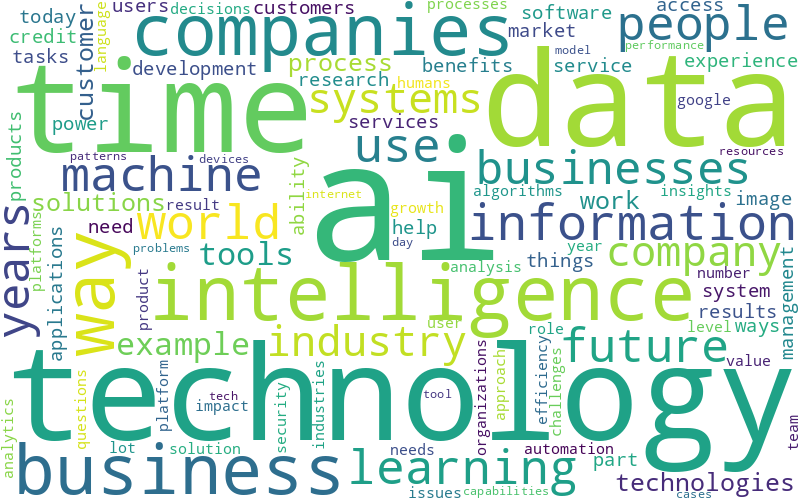


Web


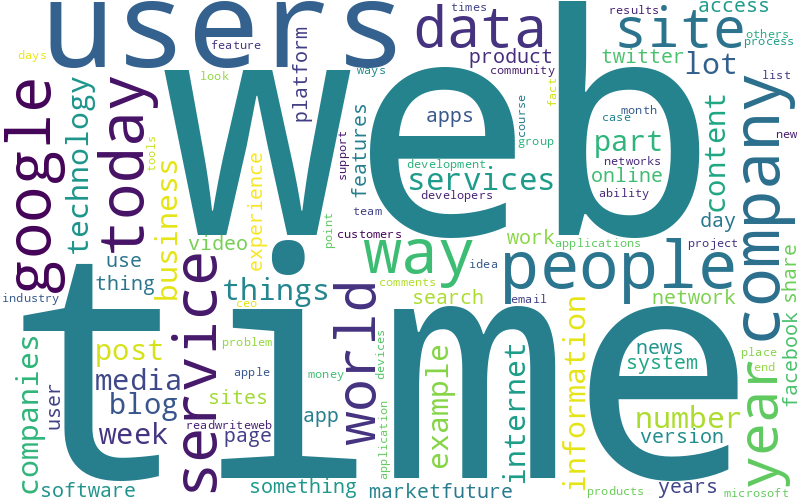


Smart Cities


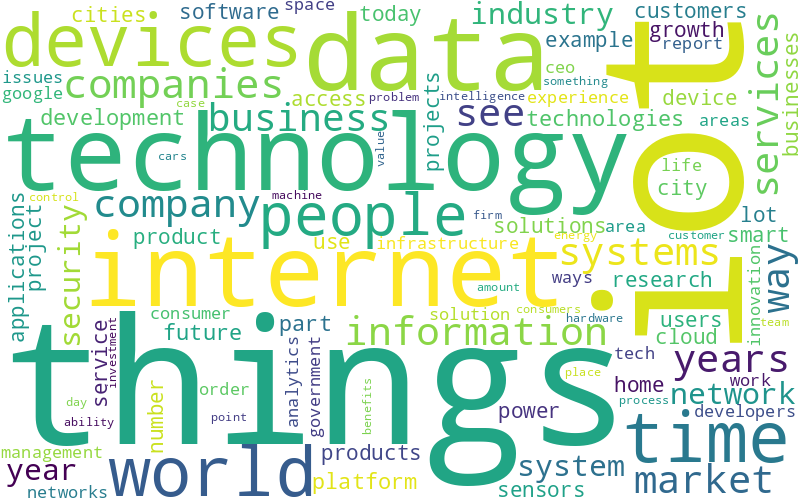


IoT


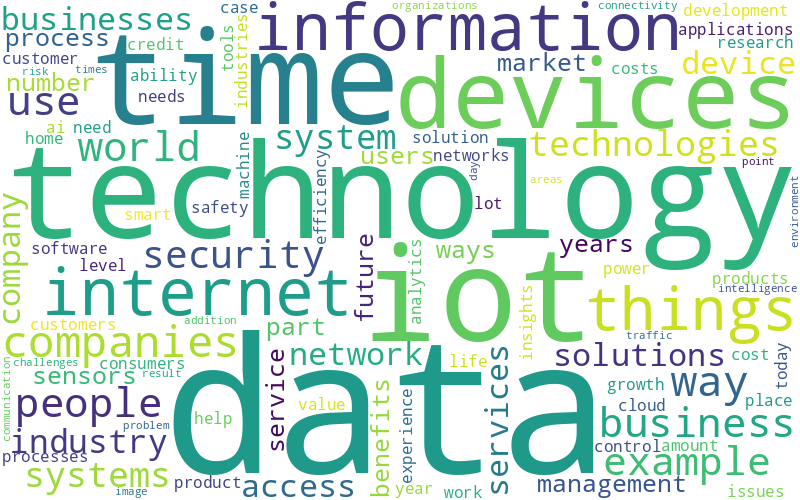


Hack


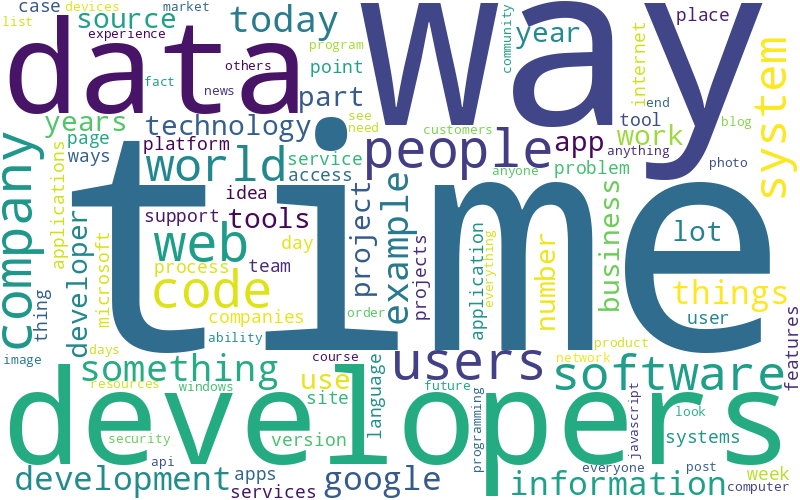


Tech


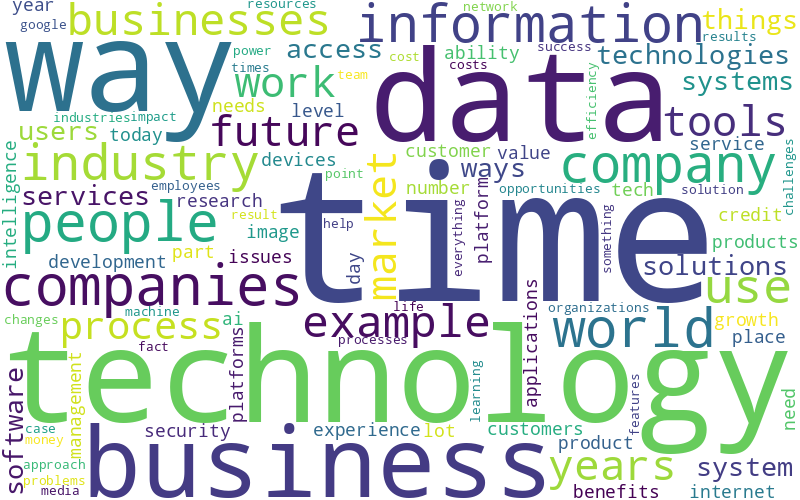


Devices


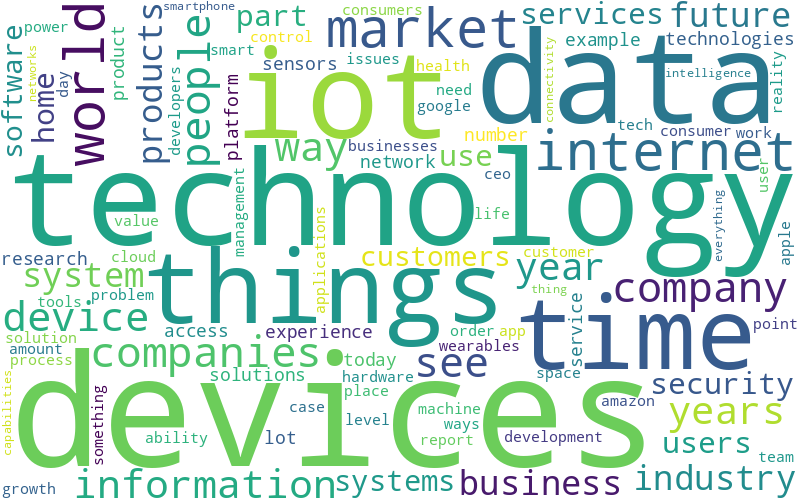

In [ ]:
for cn in counter_nouns:
  print(cn[0])
  draw_wordcloud(cn[1], f"{outcome_folder}/wordcloud_nouns_{cn[0]}.png", 100); print()

### Popular Adjectives Representing Emotional Aspects

In [ ]:
counter_adjs = []
for df_t in df_all:
  print('category: ', df_t[0])
  counter_adjs.append((df_t[0], get_counter(df_t[1], global_stopwords+local_stopwords, "JJ")))
  print(counter_adjs[-1][1].most_common(50)); print()

category:  AI
[('new', 937), ('many', 890), ('artificial', 820), ('human', 724), ('better', 692), ('potential', 600), ('different', 553), ('possible', 537), ('significant', 532), ('important', 517), ('best', 513), ('able', 503), ('various', 480), ('digital', 472), ('next', 448), ('available', 425), ('first', 422), ('recent', 415), ('specific', 403), ('right', 393), ('good', 391), ('large', 373), ('much', 372), ('big', 368), ('key', 363), ('smart', 360), ('due', 359), ('effective', 358), ('complex', 358), ('real', 358), ('great', 356), ('critical', 355), ('social', 352), ('several', 351), ('likely', 334), ('essential', 330), ('efficient', 327), ('personal', 327), ('advanced', 323), ('global', 322), ('current', 316), ('necessary', 312), ('major', 308), ('multiple', 302), ('natural', 297), ('traditional', 291), ('real-time', 286), ('high', 286), ('simple', 282), ('easy', 282)]

category:  Web
[('new', 10244), ('many', 6436), ('last', 5662), ('first', 5204), ('social', 4916), ('good', 4872

- 형용사만을 대상으로 한 키워드 분석에서는 전반적으로 IT관련 뉴스 사이트의 특성상 "new"와 "many" 등과 같은 키워드가 상위 포지션에 등장함

- 카테고리 별 분석 결과
  - AI: "artificial", "human", "better", "possible", "high" 등과 같이 인공지능 관련 표현이 많이 등장함
  - Smart Cities, IoT: "smart", "able", "connected", "mobile", "digital" 등과 같이 스마트 시티와 사물 인터넷과 관련된 표현이 많이 등장함
  - Hack: "easy", "hard", "different" 등과 같이 해킹과 관련된 표현으로 추정되는 키워드들이 등장함

AI


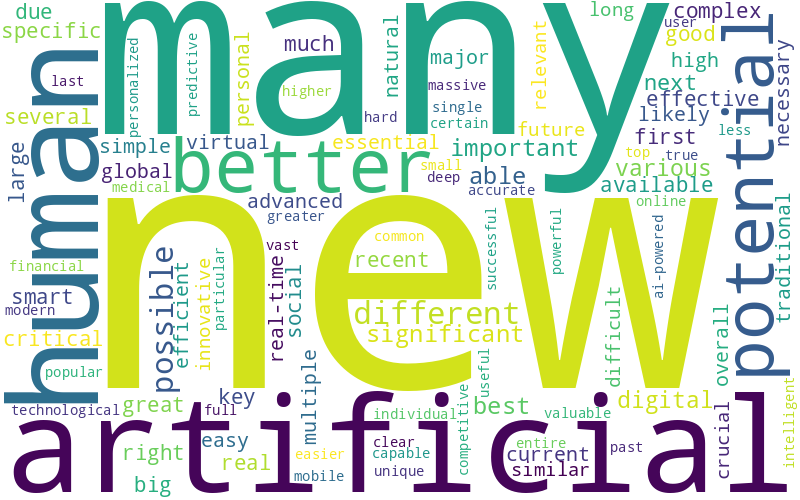


Web


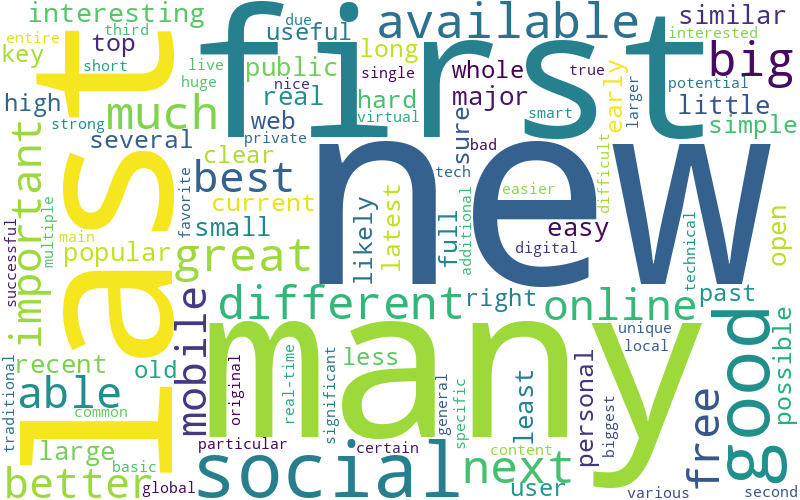


Smart Cities


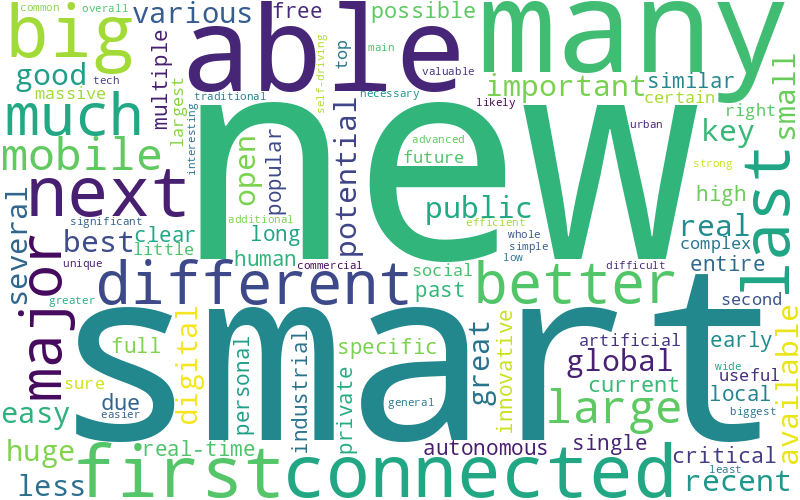


IoT


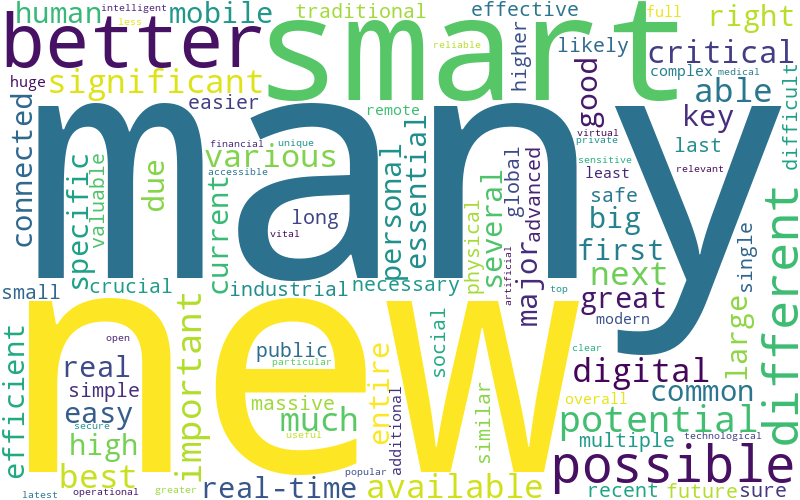


Hack


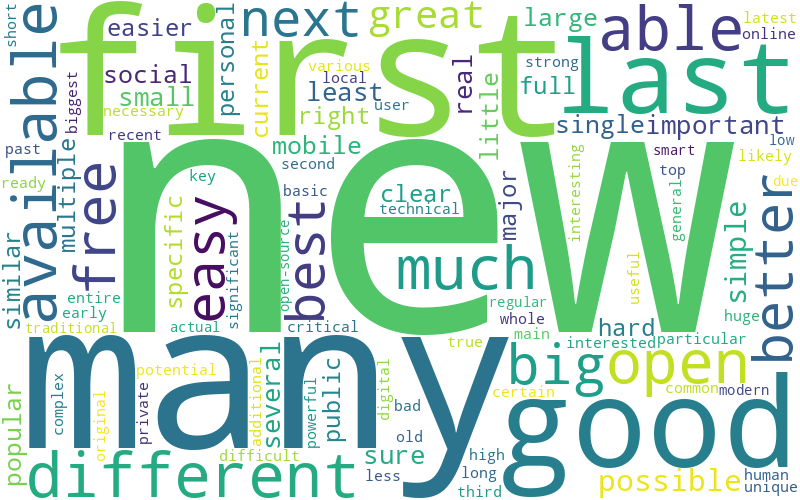


Tech


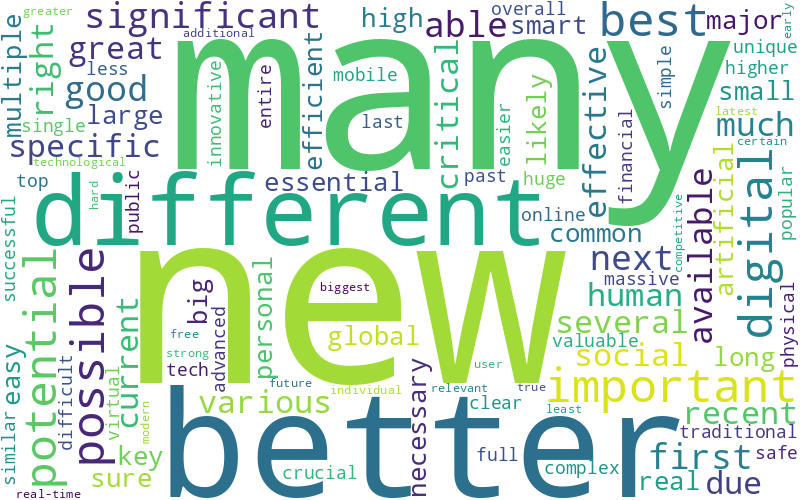


Devices


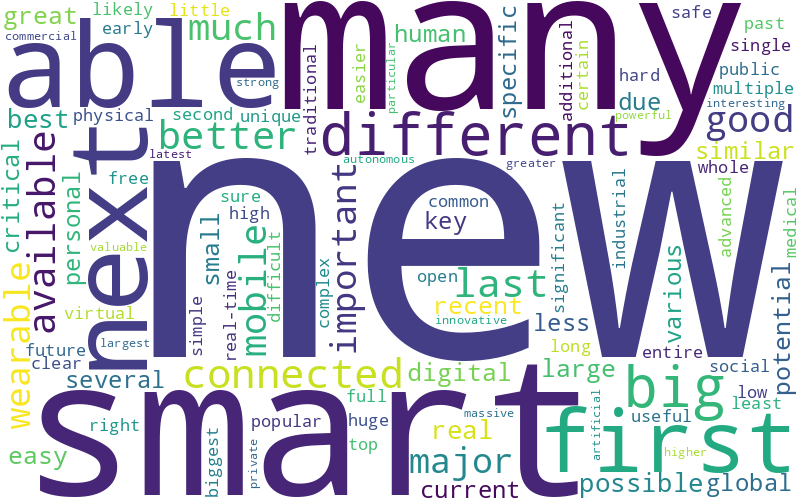

In [ ]:
for ca in counter_adjs:
  print(ca[0])
  draw_wordcloud(ca[1], f"{outcome_folder}/wordcloud_adjs_{ca[0]}.png", 100); print()

### Popular Verbs Representing Behavioral Aspects

In [ ]:
counter_verbs = []
for df_t in df_all:
  print('category: ', df_t[0])
  counter_verbs.append((df_t[0], get_counter(df_t[1], global_stopwords+local_stopwords, "VB")))
  print(counter_verbs[-1][1].most_common(50)); print()

category:  AI
[('make', 937), ('using', 855), ('help', 821), ('use', 793), ('used', 749), ('need', 731), ('take', 697), ('become', 656), ('provide', 634), ('making', 615), ('get', 609), ('improve', 605), ('based', 569), ('create', 561), ('see', 529), ('made', 522), ('find', 493), ('understand', 473), ('keep', 459), ('work', 457), ('according', 456), ('want', 452), ('including', 444), ('know', 437), ('helps', 436), ('identify', 435), ('ensure', 435), ('come', 432), ('learning', 427), ('working', 422), ('allows', 421), ('comes', 415), ('makes', 410), ('offer', 391), ('creating', 391), ('build', 373), ('learn', 364), ('providing', 361), ('increase', 355), ('develop', 351), ('let', 351), ('growing', 349), ('analyze', 342), ('going', 339), ('go', 335), ('think', 335), ('taking', 323), ('include', 323), ('increasing', 322), ('look', 319)]

category:  Web
[('make', 6978), ('see', 6939), ('get', 6710), ('use', 5894), ('using', 5597), ('want', 4984), ('think', 4761), ('know', 4734), ('take', 45

- 동사를 대상으로 한 키워드 분석에서는 'make', 'using', 'help' 등과 같이 어떠한 기술이 어떤 부분에서 무엇에 도움을 주고, 무엇을 가능케하는지에 대한 표현이 자주 등장함을 확인할 수 있음

AI


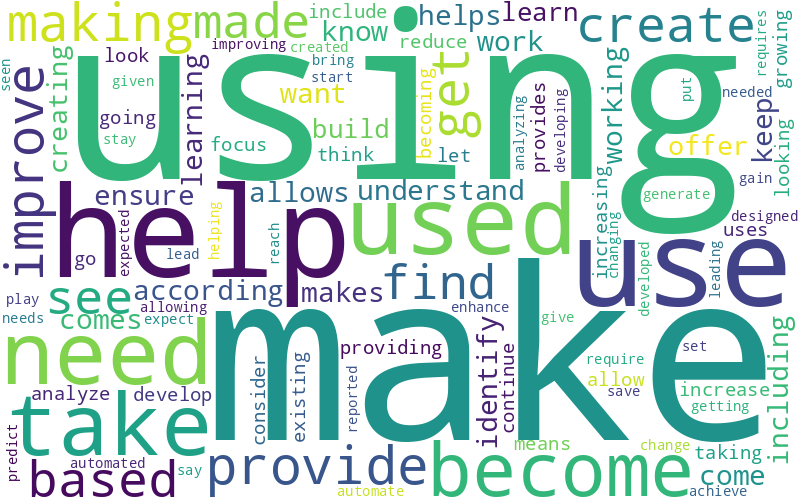


Web


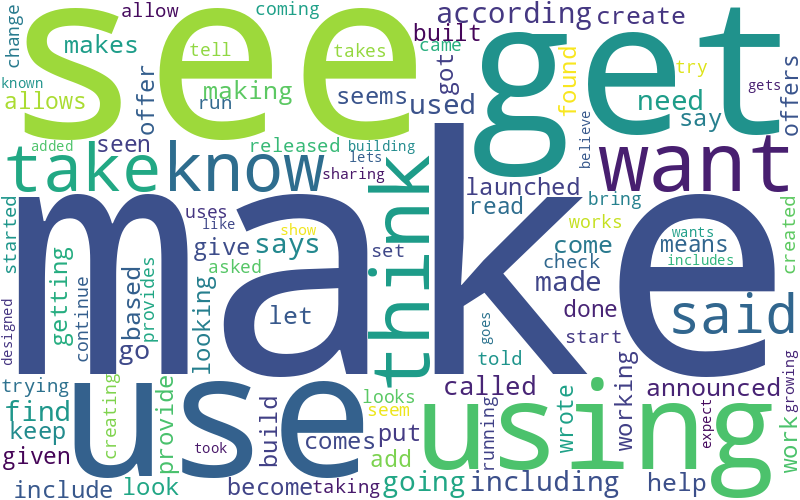


Smart Cities


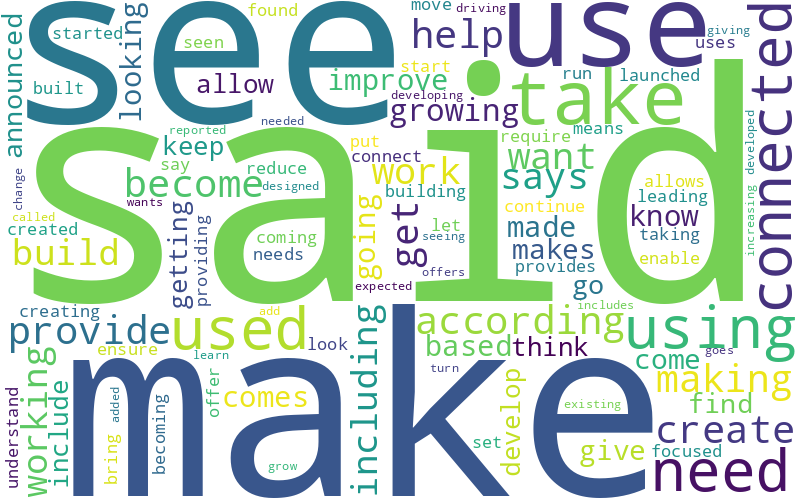


IoT


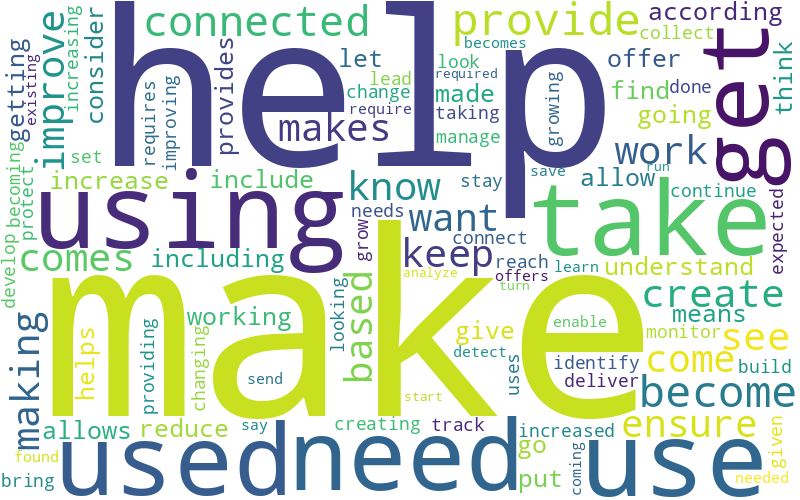


Hack


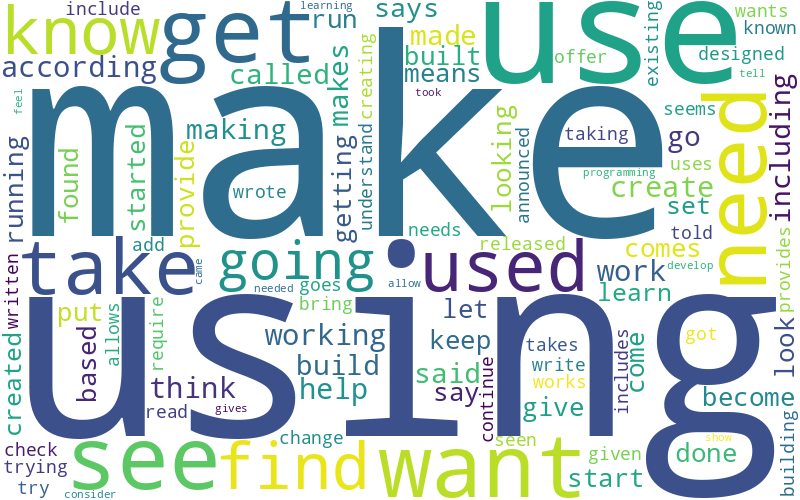


Tech


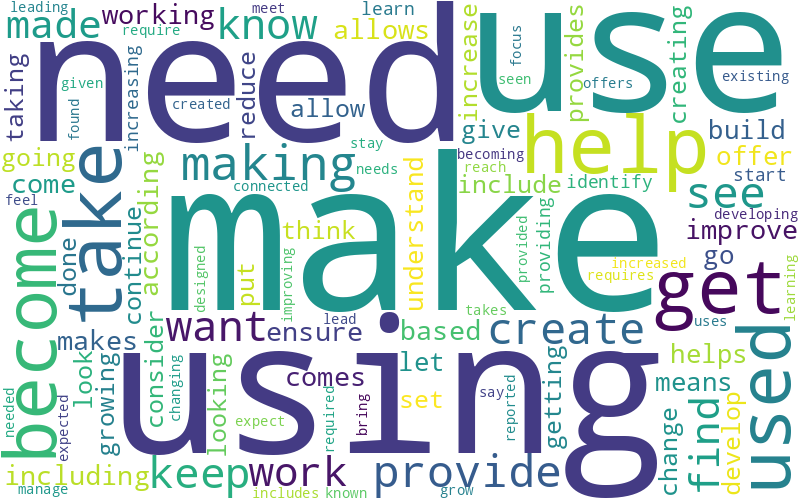


Devices


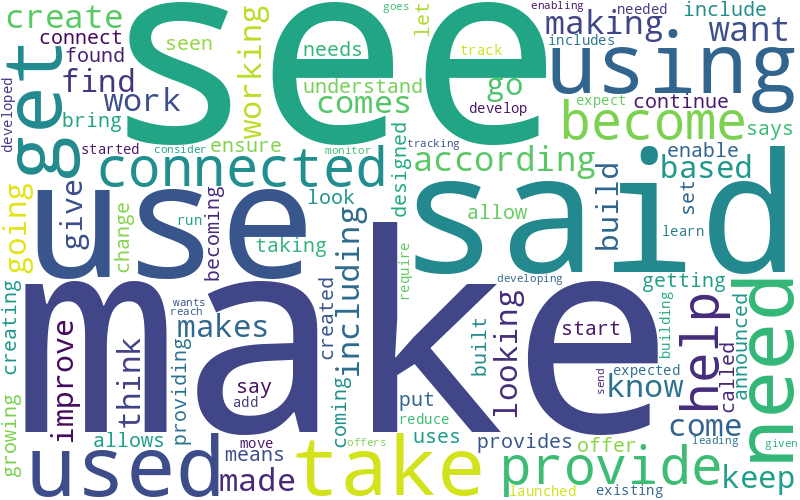

In [ ]:
for cv in counter_verbs:
  print(cv[0])
  draw_wordcloud(cv[1], f"{outcome_folder}/wordcloud_verbs_{cv[0]}.png", 100); print()

## Time Series Analysis

In [ ]:
# df.timestamp.min(), df.timestamp.max()
for df_t in df_all:
  print('category: ', df_t[0])
  print(df_t[1].timestamp.min(), df_t[1].timestamp.max())
  print()

category:  AI
2017-07-17 00:00:00 2023-08-17 00:00:00

category:  Web
2003-04-19 00:00:00 2023-08-09 00:00:00

category:  Smart Cities
2014-02-19 00:00:00 2023-07-06 00:00:00

category:  IoT
2017-06-07 00:00:00 2023-08-17 00:00:00

category:  Hack
2010-08-31 00:00:00 2023-07-21 00:00:00

category:  Tech
2010-10-01 00:00:00 2023-08-17 00:00:00

category:  Devices
2014-07-15 00:00:00 2023-08-17 00:00:00



- 수집된 웹 페이지들이 게재된 기간은 카테고리 별로 아래와 같은 time range를 가짐

  - AI: 2017년 7월 17일부터 2023년 8월 17일 (약 6년)

  - Web: 2003년 4월 19일부터 2023년 8월 9일 (약 20년)

  - Smart Cities: 2014년 2월 19일부터 2023년 7월 6일 (약 9년)

  - IoT: 2017년 6월 7일부터 2023년 8월 17일 (약 6년)
  
  - Hack: 2010년 8월 31일부터 2023년 7월 21일 (약 13년)
  
  - Tech: 2010년 10월 1일부터 2023년 8월 17일 (약 13년)
  
  - Devices: 2014년 7월 15일부터 2023년 8월 17일 (약 9년)

In [ ]:
import numpy as np

counts = []
for df_t in df_all:
  tmp_cnt = pd.Series(data=1, index=df_t[1].timestamp).resample(rule="w").count(); counts.append((df_t[0], tmp_cnt))
  print(df_t[0]); print(tmp_cnt); print()

AI
timestamp
2017-07-23     4
2017-07-30     7
2017-08-06     5
2017-08-13     2
2017-08-20     4
              ..
2023-07-23    33
2023-07-30    22
2023-08-06    11
2023-08-13     0
2023-08-20     8
Freq: W-SUN, Length: 318, dtype: int64

Web
timestamp
2003-04-20    1
2003-04-27    1
2003-05-04    1
2003-05-11    5
2003-05-18    2
             ..
2023-07-16    4
2023-07-23    0
2023-07-30    8
2023-08-06    0
2023-08-13    2
Freq: W-SUN, Length: 1061, dtype: int64

Smart Cities
timestamp
2014-02-23    2
2014-03-02    0
2014-03-09    0
2014-03-16    0
2014-03-23    0
             ..
2023-06-11    4
2023-06-18    0
2023-06-25    0
2023-07-02    0
2023-07-09    3
Freq: W-SUN, Length: 490, dtype: int64

IoT
timestamp
2017-06-11    1
2017-06-18    0
2017-06-25    0
2017-07-02    0
2017-07-09    0
             ..
2023-07-23    1
2023-07-30    4
2023-08-06    1
2023-08-13    0
2023-08-20    4
Freq: W-SUN, Length: 324, dtype: int64

Hack
timestamp
2010-09-05    11
2010-09-12    10
2010-09-19 

In [ ]:
for count in counts:
  print(count[0])
  print(count[1].mean(), count[1].std()); print()

AI
3.943396226415094 5.094990776832765

Web
16.045240339302545 23.222708235603275

Smart Cities
4.430612244897959 13.31190564627124

IoT
2.4104938271604937 3.1260437617827703

Hack
2.1575037147102525 3.5125846469720723

Tech
2.989598811292719 5.868211274233929

Devices
2.3073684210526317 4.5648455384755255



- 카테고리 별로, (주별 게재 건수 평균, 표준편차)
  - AI: (3.94, 5.09) -> 매주 약 4건
  - Web: (16.04, 23.22) -> 매주 약 16건
  - Smart Cities: (4.43, 13.31) -> 매주 약 4건
  - IoT: (2.41, 3.12) -> 매주 약 2건
  - Hack: (2.15, 3.51) -> 매주 약 2건
  - Tech: (2.98, 5.86) -> 매주 약 3건
  - Devices: (2.30, 4.56) -> 매주 약 2건

### Peak Week Analysis

<Axes: title={'center': 'Article Volume Change over Time (AI)'}, xlabel='timestamp'>

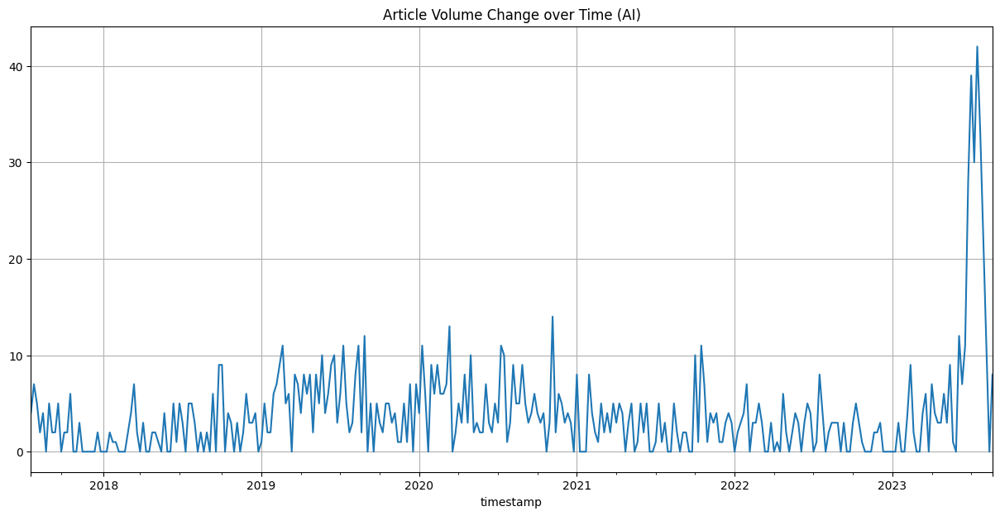

In [ ]:
counts[0][1].plot(kind="line", title="Article Volume Change over Time " + '(' + str(counts[0][0]) + ')', figsize=(15,7), grid=True)

In [ ]:
counts[0][1].max(), counts[0][1].idxmax()

(42, Timestamp('2023-07-16 00:00:00'))

In [ ]:
df_all[0][1][(df_all[0][1].timestamp >= "2023-07-12") & (df_all[0][1].timestamp < "2023-07-20")][["timestamp", "title", "body"]]

,timestamp,title,body
6,2023-07-19,"1,300 Experts: AI is Not a Threat to Humanity!",There has been a lot of interest and some fear in the field of artificial intelligence (AI) in recent years. As the limits of what can be achieved...
36,2023-07-19,$500 Million: The Price of AI Dominance,"Qualtrics, the cloud-based platform for managing online customer experiences, has announced plans to invest $500 million in AI over the next four ..."
47,2023-07-13,9 Unique Features Only AI Legal Assistants Can Provide,"The technology that we use today is constantly evolving and transforming the way many different industries function, including law. Artificial Int..."
62,2023-07-14,AI Actors: The Next Big Thing in Hollywood?,Technology and innovation are nothing new to the entertainment business. Hollywood has always been at the forefront of the use of innovative techn...
87,2023-07-13,AI Is Taking Over Space: How Artificial Intelligence Will Change the Future of Aerospace,"New opportunities for both space exploration and defense are emerging as the aerospace industry undergoes radical transformation. Steve Isakowitz,..."
89,2023-07-13,AI Is the New Firefighter: How California Is Using Technology to Prevent Wildfires,"When it comes to fighting and preventing wildfires, California has been at the forefront of the effort. The ALERTCalifornia program at the Univers..."
93,2023-07-18,AI Makers Urged to Stop Stealing from Authors,The development of Artificial Intelligence (AI) has introduced new moral dilemmas into a world where technology is advancing at an unprecedented r...
116,2023-07-12,"Airbus’ Autopilot Technology Is So Safe, You’ll Never Want to Fly Without It","After 50 years of progress, the aviation industry is now safer and more efficient than ever before, thanks in large part to Airbus’ pioneering wor..."
124,2023-07-14,AP gives OpenAI access to its vast archive of news stories,"OpenAI, a pioneer in the field of artificial intelligence (AI), has signed a license agreement with The Associated Press (AP) to use the AP’s mass..."
126,2023-07-19,Apple’s ChatGPT Rival Is Coming Soon,"In a recent report from Bloomberg’s Mark Gurman, it has been revealed that Apple is making significant strides in the development of artificial in..."


- 2023년 7월 16일에 게시물 게재수 최대치를 찍었고, 해당 주간의 기사들을 살펴보면, 'OpenAI', 'chatGPT', 'Copilot', 'Conversational Ai' 등 OpenAI의 ChatGPT가 화재였음을 확인할 수 있음

In [ ]:
counter_peak = get_counter(df_all[0][1][(df_all[0][1].timestamp >= "2023-07-12") & (df_all[0][1].timestamp < "2023-07-20")], global_stopwords+local_stopwords)
counter_peak.most_common(30)

[('image', 56),
 ('featured', 56),
 ('credit', 56),
 ('first', 53),
 ('questions', 52),
 ('ai', 52),
 ('new', 51),
 ('unsplash', 50),
 ('reported', 49),
 ('potential', 49),
 ('asked', 48),
 ('frequently', 48),
 ('technology', 46),
 ('use', 45),
 ('data', 45),
 ('provide', 44),
 ('like', 42),
 ('future', 40),
 ('artificial', 40),
 ('intelligence', 40),
 ('using', 40),
 ('q', 38),
 ('create', 38),
 ('making', 37),
 ('help', 36),
 ('enhance', 36),
 ('make', 36),
 ('however', 35),
 ('developed', 35),
 ('years', 34)]

- 본문의 내용에서 상위 30개의 키워드를 추출했을 땐 아무래도 글의 특성상 chatGPT와 관련해서 크게 두드러지는 내용은 없지만, 위에서 언급한 것처럼 타이틀과 본문의 내용을 살펴보면 대부분 이에 대한 이야기가 많았음을 확인할 수 있음

<Axes: title={'center': 'Article Volume Change over Time (Web)'}, xlabel='timestamp'>

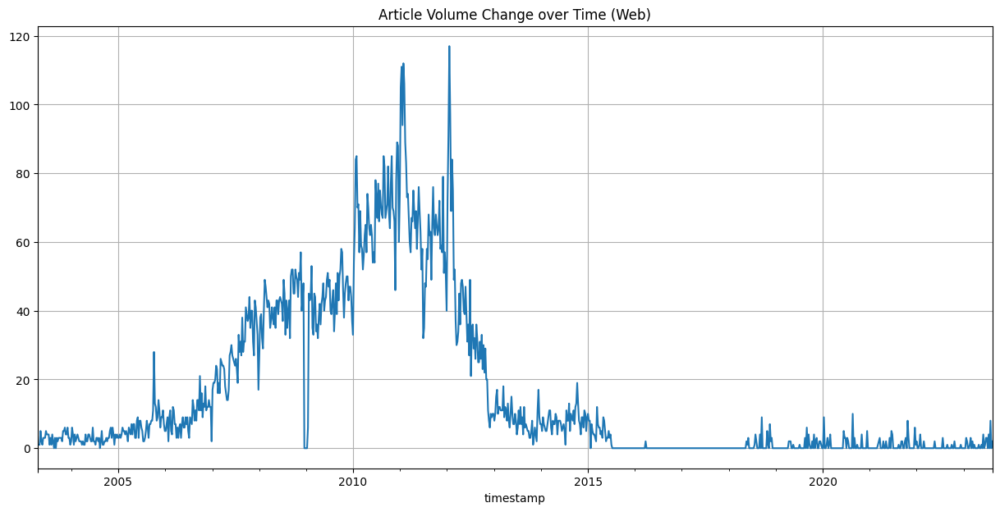

In [ ]:
counts[1][1].plot(kind="line", title="Article Volume Change over Time " + '(' + str(counts[1][0]) + ')', figsize=(15,7), grid=True)

In [ ]:
counts[1][1].max(), counts[1][1].idxmax()

(117, Timestamp('2012-01-22 00:00:00'))

In [ ]:
df_all[1][1][(df_all[1][1].timestamp >= "2012-01-18") & (df_all[1][1].timestamp < "2012-01-26")][["timestamp", "title", "body"]]

,timestamp,title,body
10697,2012-01-23,5 Things You Should Look For in a Community Manager,"In honor of Community Manager Day, I thought it would fun and worthwhile to share some tips with employers looking for the perfect community manag..."
11070,2012-01-23,"After SOPA’s Death, Anti-Piracy Advocates Scramble for a Way Forward",The effective success of grass-roots efforts to stall anti-piracy legislation in the U.S. Congress now has people whose lives and careers are affe...
11118,2012-01-19,All Four GOP Presidential Candidates Now Oppose SOPA/PIPA,The four leading presidential candidates voiced opposition to the Stop Online Piracy and Protect IP Acts in a televised debate Thursday. The most ...
11183,2012-01-18,Amazon Takes Another Pass at NoSQL with DynamoDB,"Amazon’s Dynamo paper (PDF) is the paper that launched a thousand NoSQL databases, if you’ll pardon a twisted metaphor and wee bit of exaggeration..."
11645,2012-01-24,"Driven By iPhone and iPad Growth, Apple Revenue Topped $46 Billion Last Quarter","In its quarterly earnings call this afternoon, Apple threw around quite a few very large numbers. For starters, the company brought in $46.3 billi..."
...,...,...,...
26961,2012-01-18,SOPA Uncensored: You Speak Out,"Several internet giants either blacked out today, or came out strongly against SOPA and PIPA. ReadWriteWeb covered the issue, noting who spoke ou..."
27105,2012-01-18,YouTube Tries to Make “Doing Good” Part of its Everyday Routine,One of Google’s earliest YouTube employees is now leading a new charge at the company: Trying to figure out how to make YouTube a better service f...
27129,2012-01-23,YouTube’s Reach Begins to Eclipse Television,"YouTube’s statistics continue to boggle the mind. It revealed today that it serves 4 billion videos every day, a 25% increase in the past eight mo..."
27130,2012-01-23,YouTube’s Reach Begins to Eclipse Television,"YouTube’s statistics continue to boggle the mind. It revealed today that it serves 4 billion videos every day, a 25% increase in the past eight mo..."


In [ ]:
counter_peak = get_counter(df_all[1][1][(df_all[1][1].timestamp >= "2012-01-18") & (df_all[1][1].timestamp < "2012-01-26")], global_stopwords+local_stopwords, "NN")
counter_peak.most_common(30)

[('today', 71),
 ('users', 70),
 ('world', 62),
 ('people', 60),
 ('time', 59),
 ('web', 58),
 ('company', 52),
 ('way', 51),
 ('google', 49),
 ('year', 47),
 ('facebook', 47),
 ('service', 46),
 ('twitter', 45),
 ('content', 43),
 ('media', 43),
 ('part', 41),
 ('data', 40),
 ('work', 39),
 ('product', 39),
 ('market', 39),
 ('technology', 37),
 ('user', 37),
 ('day', 36),
 ('information', 36),
 ('internet', 35),
 ('things', 34),
 ('news', 34),
 ('week', 34),
 ('services', 34),
 ('access', 33)]

- 상위 30개 명사 키워드를 보면 google, facebook, twitter 등 정보기술 대기업들이 자주 등장했음을 확인할 수 있음
- 또한, 2012년 1월 18일에 미국에서 SOPA와 PIPA와 같은 인터넷 저작권 관련 법안에 대해 대규모 인터넷 시위가 발생했었는데, 위의 기사들의 타이틀을 보면 이에 대한 내용을 많이 다루고있음을 확인할 수 있음

<Axes: title={'center': 'Article Volume Change over Time (Smart Cities)'}, xlabel='timestamp'>

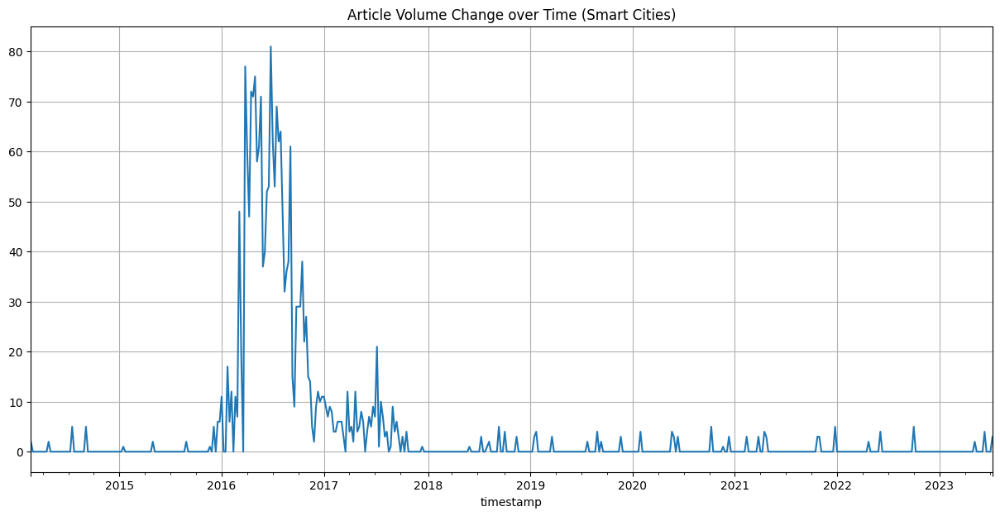

In [ ]:
counts[2][1].plot(kind="line", title="Article Volume Change over Time " + '(' + str(counts[2][0]) + ')', figsize=(15,7), grid=True)

In [ ]:
counts[2][1].max(), counts[2][1].idxmax()

(81, Timestamp('2016-06-26 00:00:00'))

In [ ]:
df_all[2][1][(df_all[2][1].timestamp >= "2016-06-22") & (df_all[2][1].timestamp < "2016-06-30")][["timestamp", "title", "body"]]

In [ ]:
counter_peak = get_counter(df_all[2][1][(df_all[2][1].timestamp >= "2016-06-22") & (df_all[2][1].timestamp < "2016-06-30")], global_stopwords+local_stopwords, "NN")
counter_peak.most_common(30)

[('iot', 80),
 ('data', 66),
 ('technology', 57),
 ('internet', 56),
 ('things', 55),
 ('years', 51),
 ('devices', 50),
 ('services', 48),
 ('company', 45),
 ('companies', 42),
 ('business', 40),
 ('systems', 40),
 ('see', 40),
 ('time', 40),
 ('information', 37),
 ('network', 36),
 ('world', 36),
 ('sensors', 35),
 ('year', 31),
 ('amount', 31),
 ('use', 31),
 ('technologies', 31),
 ('market', 31),
 ('tech', 30),
 ('ceo', 30),
 ('system', 30),
 ('consumer', 30),
 ('innovation', 27),
 ('team', 27),
 ('access', 27)]

- 본문에 대한 word 추출 결과에서 크게 눈에 띄는 점은 없었기 때문에, 본문 말고 타이틀을 기준을 다시 인사이트를 추출해봄

In [ ]:
%time df_smart_cities["words"] = df_smart_cities.title.apply(lambda x: nltk.word_tokenize(x)) # word tokenizing
%time df_smart_cities["tagged_words"] = df_smart_cities.words.apply(lambda x: nltk.pos_tag(x)) # 품사 tagging

In [ ]:
counter_peak = get_counter(df_smart_cities[(df_smart_cities.timestamp >= "2016-06-22") & (df_smart_cities.timestamp < "2016-06-30")], global_stopwords+local_stopwords, "NN")
counter_peak.most_common(30)

[('iot', 25),
 ('network', 15),
 ('things', 10),
 ('home', 10),
 ('nvidia', 10),
 ('tech', 10),
 ('cities', 6),
 ('france', 5),
 ('oui', 5),
 ('startups', 5),
 ('mais', 5),
 ('instructor', 5),
 ('cars', 5),
 ('driving', 5),
 ('energy', 5),
 ('instability', 5),
 ('grid', 5),
 ('defeat', 5),
 ('icontrol', 5),
 ('comcast', 5),
 ('offerings', 5),
 ('blackberry', 5),
 ('chance', 5),
 ('ai', 5),
 ('developers', 5),
 ('focus', 5),
 ('cloud', 5),
 ('iiot', 5),
 ('gofactory', 5),
 ('insights', 5)]

- 타이틀을 대상으로 상위 키워드를 추출한 결과 'nvidia'가 자주 등장함을 확인할 수 있음
- 관련 기사를 직접 확인해 본 결과, 2016년에 nvidia가 GPU를 활용해 비디오 인식, 자율 주행 자동차 등 스마트시티 혁신을 촉진하기 위해 다양한 기술과 솔루션을 개발하고 있었음을 확인할 수 있음.
  - 관련 기사 제목: "Is NVIDIA outpacing Apple, Google with its self-driving tech?" 등

## Document Clustering

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(use_idf=True, norm="l2", stop_words="english", max_df=0.7)
X = vectorizer.fit_transform(df.body)

In [ ]:
X.shape

(27212, 105120)

There are 27,212 documents and 105,120 words, or features.

### K-Means Clustering

### Step 1. Choose the number of clusters

In [ ]:
k = 10

### Step 2. Initialize a model object for k-means clustering

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=k, random_state=0)
kmeans

KMeans(n_clusters=10, random_state=0)

### Step 3. Fit the model using the input data

In [ ]:
%time kmeans.fit(X)

/root/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


CPU times: user 1min 52s, sys: 2.21 s, total: 1min 54s
Wall time: 1min 57s


KMeans(n_clusters=10, random_state=0)

### Step 4. Examine the clustering outcome

The focus of this step should be on identifying the characteristics of each cluster.

In [ ]:
kmeans.labels_

array([1, 3, 5, ..., 5, 5, 5], dtype=int32)

In [ ]:
df["cluster"] = kmeans.labels_

In [ ]:
df[["title", "body", "cluster"]]

,title,body,cluster
0,10 Fabulous Predictions for the Future of Cryptocurrencies,Cryptocurrencies have come a long way since the first Bitcoin which used to buy a couple of pizzas. Few of the people who owned these currencies s...,1
1,10 Ways Smart Businesses Are Leveraging IoT And AI To Bolster Business Conversion In 2019,"As a business owner, you must understand that creating awareness for your brand, product or services online and converting this awareness into act...",3
2,10 Ways Translation Tools Help Post-Pandemic,"Translation tools are the kind of things we tend to take for granted – until we need them. My family used translation tools a lot while traveling,...",5
3,11 Artificial Intelligence Trends Every Business Must Know in 2019,"Artificial Intelligence (AI) has been a game changer for global businesses, opening doors to innumerable possibilities. With the integration of AI...",3
4,11 NLP Use Cases: Putting the Language Comprehension Tech to Work,"Natural Language Processing (NLP), which encompasses areas such as linguistics, computer science, and artificial intelligence, has been developed ...",1
...,...,...,...
27207,Zune – Social Networking Differentiates It From iPod,"Microsoft has released details of its upcoming Zune product, an iPod-like device that is squarely aimed at challenging Apple’s dominance of the on...",0
27208,Zuora Announces Z-Commerce for the Cloud,"Zuora, a subscription billing company, announces today the release of Z-Commerce for the Cloud. Z-Commerce enables cloud providers to automate me...",2
27209,ZURB Design Wants To Help Your Nonprofit Complete A Mission,"Silicon Valley design agency ZURB is holding their fourth annual ZURBwired event on August 18, in which the firm donates 24 hours of their time to...",5
27210,Zync: Making Local Search Personal,"Zync, a Massachusetts-based startup, operates a local event recommendation engine based around the city of Boston. The site currently lists 30,00...",5


In [ ]:
count2 = df.cluster.value_counts()
count2

cluster
5    12576
9     3593
1     2664
6     1998
0     1432
4     1156
8     1115
7     1069
2      940
3      669
Name: count, dtype: int64

- 전체 문서들에 대해 다양한 개수의 클러스터를 찾아본 결과 10개의 클러스터를 찾았을 때 비교적 균형 있는 클러스터들을 구할 수 있었음.
-> 사실, 카테고리의 50프로 이상이 Web과 관련된 내용이라 clustering 하기가 쉽지 않았음

In [ ]:
cluster_1st, cluster_2nd, cluster_3rd, cluster_4th, cluster_5th, cluster_6th, cluster_7th, cluster_8th, cluster_9th, cluster_10th = df.cluster.value_counts().index

In [ ]:
df[df.cluster == cluster_1st].sample(10, random_state=0)[["category", "title", "body", "cluster"]]     # the largest cluster

,category,title,body,cluster
13050,{'Web'},CNET Partners with Thomson Reuters on Linked Data Initiative,"The latest implementation of OpenCalais, the Semantic API by media company Thomson Reuters, has just been announced. It’s with ‘new media’ stalwar...",5
12012,{'Web'},How the Cathedral and the Bazaar Is Shaping the Future of Comics,"Today’s startups, entrepreneurs and investors live and die by what seem like a series of holy proverbs. “Release early, release often” is perhaps ...",5
4408,{'Hack'},A Look at Phabricator: Facebook’s Web-Based Open Source Code Collaboration Tool,"It’s been out for a while, but hasn’t gotten a lot of attention. Facebook released Phabricator earlier this summer, an open source collaboration t...",5
17559,{'Web'},inDegree: A LinkedIn for Grad Students,"When we first heard about inDegree, pitched to us as a LinkedIn for graduate students, our initial response was, “Yes, but don’t graduate students...",5
3991,"{'Blockchain', 'Fintech'}",[INFOGRAPHIC] The history of Ethereum,Ethereum (ETH) creates much debate in the crpytocurrency world about whether or not the overtaking of Bitcoin is possible. Since its inception in ...,5
12356,{'Web'},Blogging with Jupiter Research,"I’m excited to be involved in the Jupiter Research blogging project, as described by Michael Gartenberg: “It wasn’t easy but we’ve just sent the...",5
11014,{'Web'},Adobe’s Ichabod and The Headless Search of Flash,"While Adobe Flash has remained popular with Web developers who want to deliver fluid user interfaces, database-driven content, and nonstandard typ...",5
18241,{'Web'},Kickstarter Shuts Down Another Anonymous-Making Internet Router,"Days after Kickstarter took down a campaign for Anonabox, the controversial Internet router that allegedly would keep its users anonymous, the com...",5
5158,{'Hack'},"Mendeley Launches $10,001 API Contest for Open Science Apps",The scientific and academic research tool Mendeley has announced a contest aimed at encouraging developers to build apps on top of Mendeley’s open...,5
13323,{'Web'},Coull.tv and The Holy Grail of Searching Within Videos,"Online video sharing sites are a dime a dozen these days, but a newly launched one caught my eye this week. Coull.tv promises to enable users to s...",5


In [ ]:
counter_max = get_counter(df[df.cluster == cluster_1st], global_stopwords+local_stopwords)
counter_max.most_common(30)

[('one', 7762),
 ('new', 7613),
 ('like', 7518),
 ('time', 5840),
 ('see', 5298),
 ('make', 5256),
 ('people', 5249),
 ('company', 5244),
 ('use', 5236),
 ('first', 5076),
 ('even', 4942),
 ('get', 4920),
 ('many', 4816),
 ('way', 4808),
 ('users', 4678),
 ('well', 4572),
 ('web', 4147),
 ('today', 4068),
 ('using', 4029),
 ('much', 4007),
 ('work', 3961),
 ('need', 3910),
 ('still', 3868),
 ('world', 3811),
 ('us', 3760),
 ('want', 3719),
 ('last', 3716),
 ('service', 3712),
 ('take', 3678),
 ('technology', 3616)]

- 가장 큰 클러스터는 역시 Web에 대한 내용임을 짐작할 수 있음. (ReadWrite는 Web category에 대한 article들이 2003년부터 게재됨)

In [ ]:
df[df.cluster == cluster_2nd].sample(10, random_state=0)[["category", "title", "body", "cluster"]]     # the second largest cluster

,category,title,body,cluster
25676,{'Web'},"Weekly Wrapup, 19-23 May 2008",Here are some of the highlights from the week’s Web Tech action on ReadWriteWeb. On the product side we explored: next gen apps outside the browse...,9
21662,{'Web'},Reflections on DEMO: Tech Innovation Alive and Well,"Not too long ago, there were some grumblings about the state of the tech blogosphere and the industry in general. By spending so much time reading...",9
16483,{'Web'},Greasemonkey Scripts For the Social Media Addict,"You may have heard of Greasemonkey, the Firefox extension that lets you customize the way a web page displays using small bits of Javascript, but ...",9
24171,{'Web'},3 Reasons Why Twitter Will NOT Index the Links You Share (Updated),Techmeme is on fire this morning with discussion of Rafe Needleman’s CNet post about Twitter’s supposed plans to index the content of links shared...,9
22313,{'Web'},Shopping 2.0: Current E-commerce Trends (Redux),"In a RWW Live podcast from last December, we discussed ‘shopping 2.0’. In this analysis of the show, we explore how e-commerce has evolved over t...",9
13468,{'Web'},Daily Wrap: Gingerbread on Majority of Android Devices and more,Gingerbread is now running on the majority of Android devices. This and more in today’s Daily Wrap. Sometimes it’s difficult to catch every story...,9
14831,{'Web'},Flipboard Gets a Big Upgrade: Adds Search & More to Its iPad App,Widely celebrated iPad social stream reading app Flipboard (Apple’s iPad App of the Year for 2010) tonight unveiled its first upgrade in more than...,9
19567,{'Web'},My Digital Web Magazine article,"My article for Digital Web Magazine, The Evolution of Corporate Websites, has now been published. It’s a high-level look at web design trends over...",9
17427,{'Web'},IBM Report on “Media’s Mean Streets”,What’s this? IBM going media 2.0? Big Blue has released a Noir-themed report entitled ‘Navigating the Media Divide: Innovating and Enabling New Bu...,9
17178,{'Web'},How To: Backup And Search All Your Friends’ Tweets In Google Reader,I just set up an automatic backup of all 3000 of my friends’ Twitter messages and became able to search through their Twitter history two years in...,9


In [ ]:
counter_max = get_counter(df[df.cluster == cluster_2nd], global_stopwords+local_stopwords)
counter_max.most_common(30)

[('web', 2775),
 ('like', 2728),
 ('new', 2716),
 ('one', 2602),
 ('people', 2249),
 ('social', 2201),
 ('users', 2061),
 ('see', 1992),
 ('time', 1986),
 ('use', 1855),
 ('way', 1767),
 ('many', 1761),
 ('google', 1752),
 ('get', 1726),
 ('facebook', 1719),
 ('well', 1693),
 ('make', 1682),
 ('company', 1670),
 ('post', 1626),
 ('us', 1603),
 ('site', 1583),
 ('service', 1568),
 ('media', 1564),
 ('even', 1563),
 ('first', 1555),
 ('much', 1552),
 ('twitter', 1536),
 ('today', 1525),
 ('content', 1524),
 ('news', 1517)]

- 두번째로 큰 클러스터 역시 Web에 대한 내용이 주를 이룸.

In [ ]:
df[df.cluster == cluster_3rd].sample(10, random_state=0)[["category", "title", "body", "cluster"]]     # the second largest cluster

,category,title,body,cluster
9951,{'Tech'},No-Code and Gen Z: The Productive and Future-Proof Match,"For the new generation of workers just entering the workforce (who we fondly call Gen Z), it’s about meaningful jobs and building an impactful car...",1
21476,{'Web'},"ReadWriteWeb Events Guide, Feb. 12 2011",We’re always on the lookout for upcoming Web tech events from around world. Know of something taking place that should appear here? Want to get yo...,1
6816,"{'Connected Devices', 'Industrial'}",Smart-Enabling Each link in a Next-Gen Supply Chain,"Any given supply chain is evolving, fast. Globalization, the “servitization” economy and shifting customer expectations are requiring producers to...",1
7385,"{'Productivity', 'Culture', 'Lifestyle', 'Work'}",Unplugging from Work Without Feeling Guilty,File this under the law of unintended consequences. Businesses are increasingly using online communication and collaboration apps to help their te...,1
7003,"{'Data and Security', 'IoT'}",Is Business Headed for a Cognitive-First Future?,As the world generates more and more data — at a clip of 2.5 quintillion bytes each day — it simultaneously struggles to manage it. With humans un...,1
2574,"{'Digital', 'Data and Security', 'IoT'}",3 Ways Data Mesh Can Improve Digital Product Development,Data management continues to change as companies try to find the best ways to manage and store endless amounts of data. Data has become a differen...,1
568,"{'AI', 'Tech'}",The RPA Noise: The Long and Short of It,The topic of robots and automation was initially met with hysteria not so long ago. We had reports of robots stealing human jobs and other misinfo...,1
2504,"{'Data and Security', 'Big Data', 'Tech'}",Responsible Data Collection: Why It Matters for Businesses Today,"As technology has evolved, so has the amount of data businesses collect about their customers and competitors. While this can be beneficial to bot...",1
9292,"{'Structure', 'Culture', 'Startups'}",Why We Need to Rethink Social Interaction in the Workplace,"Social interaction, just as the name suggests, relates to the relationships created between two or more people. It involves the interactions, comm...",1
3591,"{'Connected Devices', 'Apps', 'Devices', 'Fintech'}",Top 6 E-Wallet Technology Trends to Look for in 2020,"Since the beginning, the payment models have undergone a tremendous transformation from the barter system to cryptocurrencies. In the modern era, ...",1


In [ ]:
counter_max = get_counter(df[df.cluster == cluster_3rd], global_stopwords+local_stopwords, 'NN')
counter_max.most_common(30)

[('data', 2127),
 ('time', 1878),
 ('companies', 1706),
 ('information', 1702),
 ('technology', 1679),
 ('way', 1669),
 ('people', 1653),
 ('business', 1640),
 ('company', 1548),
 ('world', 1474),
 ('example', 1298),
 ('work', 1228),
 ('access', 1185),
 ('years', 1170),
 ('use', 1161),
 ('businesses', 1156),
 ('things', 1132),
 ('today', 1111),
 ('process', 1110),
 ('services', 1100),
 ('software', 1093),
 ('security', 1092),
 ('tools', 1084),
 ('system', 1076),
 ('management', 1075),
 ('industry', 1070),
 ('ways', 1042),
 ('systems', 1024),
 ('future', 995),
 ('market', 978)]

- 세번째로 큰 클러스터는 Tech 또는 Data와 관련된 내용임을 확인할 수 있음

In [ ]:
df[df.cluster == cluster_10th].sample(10, random_state=0)[["title", "body", "cluster"]]     # the smallest cluster

,title,body,cluster
9369,5 Ways Artificial Intelligence is Transforming Recruitment in 2019,"Artificial Intelligence (AI) is affecting a lot of industries, and the recruitment industry is not an exception. The history of recruitment goes a...",3
582,Top 10 Actionable Ways To Optimize mCommerce with Artificial Intelligence in 2018,"Google is probably one of the most active tech giants when it comes to Artificial Intelligence. In their most recent I/O, they probably demonstrat...",3
25,4 Ways AI Will Revolutionize the Marketing Industry,Artificial intelligence (AI) technology is here — and it’s long overdue. The technology is rapidly gaining traction and becoming a prominent force...,3
7876,5 ways Artificial Intelligence is Revolutionizing eCommerce Marketing,Marketing strategies are continuously changing due to increasing technological advancement. Technology is responsible for raising the exceptions o...,3
119,AI’s Melodic Revolution: Meta’s MusicGen,"Meta’s latest AI innovation, MusicGen, is making waves in the music industry. This powerful music-generating tool is designed to create unique mel...",3
291,How AI and Machine Learning Are eCommerce Tech Game Changers,The trend in eCommerce has been driving quickly towards AI and Machine Learning. The onset of COVID-19 has accelerated this development for many c...,3
6907,Why artificial intelligence will finally unlock IoT,"According to Gartner, there will be more than 20 billion connected devices worldwide by 2020. Today’s enterprises are already benefitting greatly ...",3
5828,Decoding the Future Trajectory of Healthcare with AI,"Artificial Intelligence (AI) is getting increasingly sophisticated day by day in its application, with enhanced efficiency and speed at a lower co...",3
9950,No-Code AI Beings are Shaping the Future of Work,"With technological advances, modern organizations face two increasing but related challenges: optimizing business processes through automation and...",3
2470,Leverage Generative AI Advantages While Safeguarding Your Future,Generative AI has a transformative impact across nearly all industries and applications. Large Language Models (LLMs) have revolutionized natural ...,3


In [ ]:
counter_min = get_counter(df[df.cluster == cluster_10th], global_stopwords+local_stopwords)
counter_min.most_common(30)

[('ai', 669),
 ('intelligence', 589),
 ('artificial', 576),
 ('data', 561),
 ('technology', 553),
 ('use', 536),
 ('like', 521),
 ('one', 504),
 ('time', 503),
 ('new', 485),
 ('help', 482),
 ('make', 479),
 ('using', 475),
 ('human', 459),
 ('learning', 456),
 ('even', 456),
 ('need', 450),
 ('many', 449),
 ('companies', 435),
 ('way', 433),
 ('machine', 427),
 ('business', 420),
 ('future', 420),
 ('used', 404),
 ('information', 403),
 ('better', 402),
 ('work', 398),
 ('potential', 392),
 ('world', 386),
 ('take', 376)]

- 가장 작은 클러스터는 AI와 관련된 내용임을 확인할 수 있음

## Topic Modeling

### Step 1. Choose the number of topics

In [ ]:
num_topics = 10

### Step 2. Initialize a model object for LDA topic modeling

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation as LDA

lda = LDA(n_components=num_topics, random_state=0)     # LDA uses randomness to get a probability distribution
lda

LatentDirichletAllocation(random_state=0)

sklearn.decomposition.LatentDirichletAllocation: https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html

### Step 3. Fit the model using the input data

In [ ]:
%time lda.fit(X)

CPU times: user 2min 13s, sys: 18.7 s, total: 2min 32s
Wall time: 2min 16s


LatentDirichletAllocation(random_state=0)

### Step 4. Examine the output of topic modeling

In [ ]:
def show_topics(model, feature_names, num_top_words):
    for topic_idx, topic_scores in enumerate(model.components_):
        print("*** Topic {}:".format(topic_idx))
        print(" + ".join(["{:.2f} * {}".format(topic_scores[i], feature_names[i]) for i in topic_scores.argsort()[::-1][:num_top_words]]))
        print()

In [ ]:
show_topics(lda, vectorizer.get_feature_names_out(), 15)

*** Topic 0:
577.72 * data + 500.25 * iot + 372.21 * ai + 297.23 * cloud + 282.67 * security + 273.29 * technology + 260.71 * business + 254.19 * devices + 245.54 * smart + 224.56 * companies + 197.50 * time + 196.50 * customer + 195.11 * customers + 190.69 * new + 180.59 * need

*** Topic 1:
3.37 * isis + 3.10 * eero + 2.78 * meridian + 2.73 * greeniq + 2.65 * thoora + 2.27 * thursdays + 2.12 * pendleton + 1.96 * sau + 1.92 * alkhouri + 1.67 * notifixious + 1.64 * jupiterresearch + 1.62 * webrtc + 1.59 * trapit + 1.58 * roadie + 1.58 * feedflare

*** Topic 2:
3.74 * m2 + 3.70 * solair + 3.66 * tado + 3.62 * carekit + 3.51 * cts + 3.41 * visionmobile + 3.18 * noms + 3.17 * xterio + 2.70 * ez + 2.65 * w3schools + 2.63 * gro + 2.39 * formspring + 2.33 * ocf + 2.32 * tropo + 2.21 * ricard

*** Topic 3:
3.54 * sprouter + 3.47 * iob + 3.27 * publicis + 2.89 * bungee + 2.69 * vcharge + 2.61 * mirantis + 2.53 * grush + 2.50 * powermeter + 2.18 * wuellner + 2.12 * snapstick + 1.98 * sitemeter 

### Topic Model Visualization

In [ ]:
import pyLDAvis
import pyLDAvis.lda_model

pyLDAvis.enable_notebook()

pyLDAvis: https://github.com/bmabey/pyLDAvis

In [ ]:
pyLDAvis.lda_model.prepare(lda, X, vectorizer)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
8     -0.294700  0.070982       1        1  49.600587
0     -0.291022 -0.071785       2        1  40.600105
7      0.077258 -0.001101       3        1   1.338107
6      0.069462  0.007410       4        1   1.289668
2      0.074547 -0.000509       5        1   1.240894
4      0.073601 -0.001416       6        1   1.209914
5      0.073543 -0.000888       7        1   1.204815
3      0.073089 -0.001021       8        1   1.190475
9      0.072379 -0.000605       9        1   1.170337
1      0.071844 -0.001066      10        1   1.155098, topic_info=             Term        Freq       Total Category  logprob  loglift
48002         iot  430.000000  430.000000  Default  30.0000  30.0000
51511        know  186.000000  186.000000  Default  29.0000  29.0000
100953        web  500.000000  500.000000  Default  28.0000  28.0000
39405      google  680.000000  680.000000  Default  27.0000  27.0000
5369           ai  321.000000  321.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
48051      ipaper    0.407019    0.967642  Topic10  -8.9413   3.5950
37579    garfield    0.315470    0.726277  Topic10  -9.1961   3.6271
101129     webrtc    0.447278    1.375602  Topic10  -8.8470   3.3375
55306       lucmo    0.324684    0.789840  Topic10  -9.1673   3.5720
32950   extractiv    0.326999    0.906258  Topic10  -9.1602   3.4416

[501 rows x 6 columns], token_table=        Topic      Freq     Term
term                            
253         4  0.844760    100rc
355         8  0.780352     1100
1026        1  0.996043       1m
2026        4  0.647783    3tera
2608        2  0.997057       5g
...       ...       ...      ...
104034      2  0.021730  youtube
104292      3  0.854428    zatar
104459      3  1.088077     zest
104492      5  0.910286     zhao
104689      5  1.093455     zong

[505 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[9, 1, 8, 7, 3, 5, 6, 4, 10, 2])

- 다양한 개수의 토픽들을 시도해보아도 주로 2개의 큰 토픽과 서로 대부분 겹치는 작은 토픽들로 나누어지는 것을 확인할 수 있었음. ReadWrite가 카테고리별로 글들이 정리되어있기는 하지만, Web, Data와 관련된 내용이 지배적으로 많음.